# Introduction - Quantum Fourier Transform

This code demonstrates the implementation of the Quantum Fourier Transform (QFT) and its adjoint using IBM's Qiskit framework (more information on IBM's Qiskit can be found [here](https://www.ibm.com/quantum/qiskit)). This package provides the user the ability to work with circuits and quantum computing algorithms. I found their [documentation](https://qiskit.qotlabs.org/guides) very useful when trying to understand the capabilities and syntax of this framework. 

The algorithm I implementated is a quantum algorithm that performs the Fourier transform on the amplitudes of a quantum state. It maps a quantum state in the computational basis to one in the Fourier basis, encoding frequency information about the input state. I initialize quantum states in various configurations, apply the QFT, and visualize the quantum states and their transformations through the use of drawing circuits with Qiskit. The function qft_dag(n) reverses the qubit order and applys controlled phase gates and Hadamard operations. These operations ensure the proper inverse transformation.

The code also includes a practical example of controlled modular exponentiation, which is a key component of Shor's algorithm. This operation is combined with the QFT to demonstrate how quantum circuits can solve problems involving modular arithmetic. By visualizing quantum states and measurement histograms, the code provides a detailed look at the inner workings of the QFT and its integration into complex quantum algorithms. This implementation is not only educational but also can be a starting point for extending QFT-based techniques to larger quantum systems or noisy environments.

The math behind the algorithm is quite technical, however, I found this [article](https://medium.com/@belal.db/quantum-fourier-transform-the-math-behind-the-circuit-400df5dd4abe) to go into the proof in great detail. Also, Wikipedia has brief explanation [here](https://en.wikipedia.org/wiki/Quantum_Fourier_transform). 

# Import and Initialize

This first block of code sets us up to implement and draw the QFT. Half of the packages are the typical packages we should all be familar with, and the other half are the neccessary parts of Qiskit we need. After the imports, we can use the simulated quantum backend modeled by IBM's real quantum device, the Vigo quantum processor. The following functions are initialized to convert, pad, extract, and visualize data. These functions will be called in the next section where the algorithm is implemented.  

In [4]:
#Parker Johnson - Using IBM's Qiskit to implement a Quantum Fourier transform 
import numpy as np  
from numpy import random                                  # Importing the random module from NumPy
import matplotlib as mpl                                  # Importing the matplotlib library for plotting
import matplotlib.pyplot as plt                           # Importing pyplot from matplotlib for easy plotting
import matplotlib.patches as patches                      # Importing patches from matplotlib for drawing shapes
import regex as re                                        # Importing the regex library for regular expressions
import qiskit, qiskit_aer                                 # Importing Qiskit and its Aer module for quantum simulations
import qiskit.visualization as qisvis                     # Importing Qiskit's visualization tools
from qiskit.providers.fake_provider import fake_provider  # Importing fake_provider to simulate quantum hardware
from qiskit import QuantumCircuit, Aer, transpile         # Importing necessary tools for quantum circuits and simulation
from qiskit.visualization import plot_histogram           # Importing a Qiskit function to plot histograms
from math import gcd                                      # Importing the gcd (greatest common divisor) function from the math library
from numpy.random import randint                          # Importing randint for generating random integers
import pandas as pd                                       # Importing pandas for data manipulation
from fractions import Fraction                            # Importing Fraction for handling rational numbers

vigoBackend = fake_provider.FakeVigo() # Simulating a quantum backend based on IBM's Vigo machine
rng = random.default_rng() # Creating a random number generator
mystyle = {'linecolor':'#999', 'displaycolor': {'cx':'#06C', 'ccx':'#06C', 'cswap':'#06C'} } # Defining style for circuit visualization

# Converts an integer to a binary string of length numBits
def bstr(integer, numBits):
    return bin(integer)[2:].zfill(numBits)

# Pads the quantum measurement counts with zero counts for missing states
def padCounts(cts, numBits):
  def sanitize(count): 
      return (0 if count==None else count)
  n = numBits
  return {bstr(i,n):sanitize(cts.get(bstr(i,n))) for i in range(2**n)}

# Extracts the statevector (quantum state) from a quantum result object
def getStatevector (res, statevectorName='statevector'):
    return np.asarray(res.data() [statevectorName])

# Extracts all statevectors from a quantum result object based on a pattern
def getStatevectors (res, pattern='psi'):
   dat = res.data()
   statevectorNames = [key for key in dat.keys() if re.search(pattern, key)]
   statevectorNames.sort()
   #statevectorNames = [key for key in dat.keys() if key[:3]=='psi']
   return np.asarray([dat[statevectorName] for statevectorName in statevectorNames])

# Plots a quantum statevector's probabilities and phases as a bar chart
def plotStatevector(psi,ax='auto',figsize='auto',vertical=False,cmap=mpl.cm.hsv):
   # Determine dimensions
   nmax = int(np.log(len(psi)) / np.log(2)) # number of qubits
   lmax = 2**nmax                           # number of states
   probs = np.abs(psi)**2
   phases = np.remainder(np.angle(psi) / (2*np.pi), 1)
   # If user hasn't supplied an ax, create one now
   if ax=='auto':
      if figsize=='auto':
         figsize = (2,6) if vertical else (6,1)
      fig,ax = plt.subplots(figsize=figsize)
   # Plot
   if vertical:
      for l in range(lmax):
         patch = patches.Rectangle([0,-l-1], probs[l],1, ec='black', fc=cmap(phases[l]))
         ax.add_patch(patch)
      ax.set_yticks([-l-1+.5 for l in range(lmax)])
      ax.set_yticklabels([bstr(l,nmax) for l in range(lmax)])
      ax.set_ylim(-lmax-.5, .5)
      ax.set_xlim(0, max(probs)*1.1)
   else:
      for l in range(lmax):
         patch = patches.Rectangle([l,0], 1,probs[l], ec='black', fc=cmap(phases[l]))
         ax.add_patch(patch)
      ax.set_xticks([l+.5 for l in range(lmax)])
      ax.set_xticklabels([bstr(l,nmax) for l in range(lmax)])
      ax.set_xlim(-.5, lmax+.5)
      ax.set_ylim(0, max(probs)*1.1)

# Plots a histogram of quantum measurement counts
def plotHistogram(counts,ax='auto',figsize='auto',vertical=False,fc='#9cf',textrot=0):
   # Pad counts
   if isinstance (counts, dict):
      nmax = len(list(counts.keys()) [0] )
      counts = padCounts(counts,nmax)
      counts = list(counts.values())
   # Determine dimensions
   nmax = int(np.log(len(counts)) / np.log(2)) # number of qubits
   lmax = 2**nmax                              # number of states
   ymax = max(counts)
   # If user hasn't supplied an ax, create one now
   if ax=='auto':
      if figsize=='auto':
         figsize = (2,6) if vertical else (6,1)
      fig,ax = plt.subplots(figsize=figsize)
   # Plot
   if vertical:
      for l in range(lmax):
         c = counts[l]
         patch = patches.Rectangle([0,-l-1], c,1, ec='black', fc=fc)
         ax.add_patch(patch)
         if c>0:
            y = (c+.07*ymax if c<0.9*ymax else c-.07*ymax)
            ax.text (y, -l-1+.5, c, va='center',ha='center')
      ax.set_yticks([-l-1+.5 for l in range(lmax)])
      ax.set_yticklabels([bstr(l,nmax) for l in range(lmax)])
      ax.set_ylim(-lmax-.5, .5)
      ax.set_xlim(0, ymax*1.02)
   else:
      for l in range(lmax):
         c = counts[l]
         patch = patches.Rectangle([l,0], 1,c, ec='black', fc=fc)
         ax.add_patch(patch)
         if c>0:
            y = (c+.07*ymax if c<0.9*ymax else c-.07*ymax)
            ax.text (l+.5, y, c, va='center',ha='center')
      ax.set_xticks([l+.5 for l in range(lmax)])
      ax.set_xticklabels([bstr(l,nmax) for l in range(lmax)])  
      ax.tick_params(axis='x', labelrotation=textrot)
      ax.set_xlim(-.5, lmax+.5)
      ax.set_ylim(0, ymax*1.02)

#sim = qiskit_aer.AerSimulator()                         # run this line if you want to use ideal simulator
sim = qiskit_aer.AerSimulator.from_backend(vigoBackend)  # uncomment and run if you want to use a noisy simulator based on IBM's Vigo machine

# Implementation of the QFT

This block of code implements and visulaizes the QFT. The first function is crucial to initialize the quantum state. You can mess with this be changing the line initStates(cir,[2,14]) to any of the options in the initStates function. This change will be reflected in the histogram and circuit outputted below. 

The qft_dag function constructs the inverse QFT with the use of swap gates, controlled phase gates, and Hadamard gates. The histogram shows the intial state (that you set), the theoretical distribuition of after the QFT is applied, and the experimental distribuition that shows the number of counts in each state at the end. You can change the line, job = sim.run(exe, shots=10000), to whatever sample size you see fit. The theoretical, psi1, and experimental, cts, are nearly identically distributed which is a good sign. 

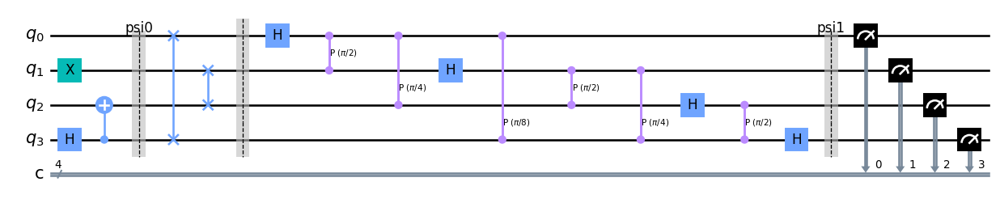

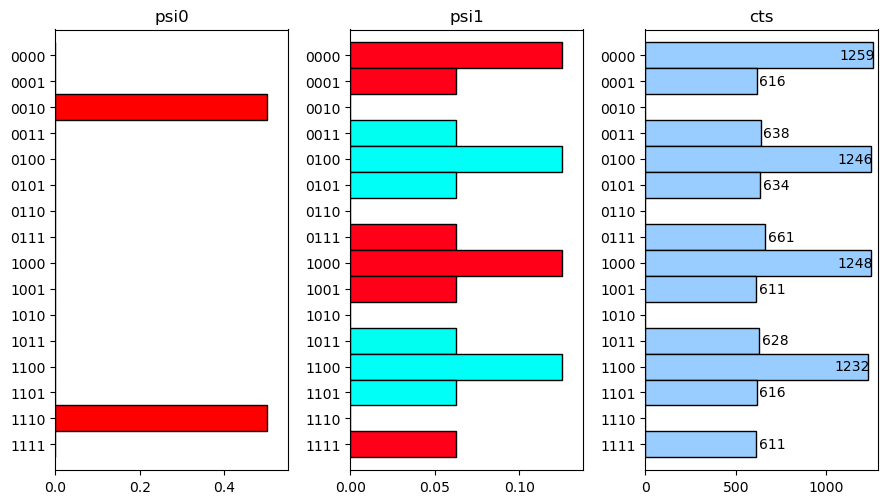

In [6]:
#Quantum Fourier Transform Code
# Initializes the quantum state of a circuit based on the input `vals`
def initStates(cir,vals):
   if vals==0:             # No initialization  
       pass
   elif vals==1:           # Initialize qubit 0 to |1>
       cir.x(0) 
   elif vals=='all':       # Apply Hadamard gates to qubits 0-3 for superposition
       cir.h(0); cir.h(1); cir.h(2); cir.h(3)
   elif vals==[1,15]:      # Custom initialization with control operations on qubits
       cir.h(3); cir.cx(3,2); cir.cx(3,1); cir.x(0)
   elif vals==[2,14]: 
       cir.h(3); cir.cx(3,2); cir.x(1)
   elif vals==[3,13]:
       cir.h(3); cir.cx(3,2); cir.cx(3,1); cir.x(1); cir.x(0)
   elif vals==[4,12]: 
       cir.h(3); cir.x(2)

# Building and drawing circuit
def qft_dag(n):
    q_c = QuantumCircuit(n)        # Initializes a quantum circuit with `n` qubits
    for q in range(n//2):
        q_c.swap(q, n-q-1) # Reverses qubit order by swapping
    for i in range(n): # Applies controlled phase and Hadamard gates to perform QFT dagger
        for j in range(i):
            q_c.cp(-np.pi/float(2**(i-j)), j, i) # Controlled phase rotations
        q_c.h(i)  # Hadamard gate to finalize the QFT dagger
    q_c.name = "QFT dagger" # Assign a name to the QFT dagger circuit
    return q_c

# Custom function to create a controlled modular exponential gate
def c_a_mod15(a, power):
    U = QuantumCircuit(5)
    for i in range(power):
            U.swap(2,3)
            U.swap(1,2)
            U.swap(0,1)
    U = U.to_gate()
    U.name = f"{a}^{power}mod15"
    c_U = U.control()
    return c_U

N_COUNT = 6  # number of counting qubits
a = 2        # Value to use for modular exponentiation
q_c = QuantumCircuit(N_COUNT + 5, N_COUNT + 5)

# Apply Hadamard gates to all counting qubits for superposition
for q in range(N_COUNT):
    q_c.h(q)

q_c.x(N_COUNT) # X gate initializes the second register in state |00001>,in preparation for accumulating the modular exponential.

# Controlled modular exponentiation with varying powers of 2
for q in range(N_COUNT):
    q_c.append(c_a_mod15(a, 2**q), [q] + [i+N_COUNT for i in range(5)])
    
q_c.measure([6, 7, 8, 9, 10], [0, 1, 2, 3, 4])     # measure q6,q7,q8,q9,q10 and store in c0,c1,c2,c3,c4
q_c.barrier()
q_c.append(qft_dag(N_COUNT), range(N_COUNT))
q_c.barrier()
q_c.measure(range(N_COUNT), range(N_COUNT))
q_c.draw(fold=-1,cregbundle=False)  # -1 means 'do not fold'
# Building and drawing circuit

cir = qiskit.QuantumCircuit(4,4)    # Create a 4-qubit circuit with 4 classical bits
initStates (cir,[2,14])             # Initialize the circuit to a specific state, YOU CAN CHANGE [2,14] TO ANY STATE IN 'INITSTATES' ABOVE
cir.save_statevector(label='psi0')  # Save the initial statevector labeled 'psi0'
cir.swap(0,3); cir.swap(1,2)        # Swaps to reorder qubits       
cir.barrier()

# Apply a series of Hadamard and controlled phase rotations for QFT
cir.h(0); cir.cp(np.pi/2, 1,0); cir.cp(np.pi/4, 2,0); cir.cp(np.pi/8, 3,0)
cir.h(1); cir.cp(np.pi/2, 2,1); cir.cp(np.pi/4, 3,1)
cir.h(2); cir.cp(np.pi/2, 3,2)
cir.h(3)
cir.save_statevector(label='psi1') # Save the final statevector labeled 'psi1'

cir.measure([0,1,2,3],[0,1,2,3]) # Measure all qubits and store results in the classical bits

fig,ax = plt.subplots (figsize=(24,3))
cir.draw('mpl', fold=-1, justify='left', ax=ax); plt.show()

# Run
sim = qiskit.Aer.get_backend('statevector_simulator')  # Initialize the statevector simulator
exe = qiskit.transpile(cir, sim)                       # Transpile the circuit for the simulator
job = sim.run(exe, shots=10000)                        # Run the job on the simulator with 10,000 shots
res = job.result()                                     # Get the simulation results
cts = res.get_counts(exe)                              # Retrieve the counts of measurement results
psi = getStatevectors (res, 'psi')                     # Get the saved statevectors ('psi0' and 'psi1')

#Plot results 
fig,axs = plt.subplots (1,3, figsize=(9,5)); fig.tight_layout() 
ax=axs[0]; plotStatevector(psi[0],ax=ax,vertical=True); ax.set_title ('psi0')
ax=axs[1]; plotStatevector(psi[1],ax=ax,vertical=True); ax.set_title ('psi1')
ax=axs[2]; plotHistogram(cts,ax=ax,vertical=True); ax.set_title ('cts');

# Implementation of Shor's Algorithm

[Shor's Algorithm](https://cc.ee.ntu.edu.tw/~rbwu/rapid_content/course/QC/Shor1994.pdf) was developed by Mathematician Peter Shor in 1994. The algorithm makes it possible to find the prime factors of an integer. This has interesting applications in public-key cryptography schemes used today. For example, it is feasible that some day when quantum computers become more powerful this algorithm will be to break [RSA](https://en.wikipedia.org/wiki/RSA_(cryptosystem)) encryption. 

Within the IBM Qiskit documentation, I also found that there is [class](https://docs.quantum.ibm.com/api/qiskit/0.24/qiskit.aqua.algorithms.Shor) that implements Shor's algorithm. This may also be an interesting check. On top of that, a brief discussion of modular exponentiation can be found [here](https://qmunity.thequantuminsider.com/2024/06/10/shors-algorithm/). 

The code below implements the algorithm. For a more in depth analysis and insight on a variety of Quantum Algorithms, a researcher by the name of [Monit Sharma](https://monitsharma.github.io/portfolio/) has a great [github](https://monitsharma.github.io/Learn-Quantum-Computing-with-Qiskit/#quantum-protocols-and-quantum-algorithms) going through a wide randge of these algorithms. 

   (2nd reg: 5 bits) (1st reg: 6 bits)         Phase
0     u=00001 f=000000(bin) =   0(dec)   0/64 = 0.00
1     u=00100 f=000000(bin) =   0(dec)   0/64 = 0.00
2     u=00010 f=010000(bin) =  16(dec)  16/64 = 0.25
3     u=01000 f=010000(bin) =  16(dec)  16/64 = 0.25
4     u=00010 f=100000(bin) =  32(dec)  32/64 = 0.50
5     u=00100 f=110000(bin) =  48(dec)  48/64 = 0.75
6     u=01000 f=100000(bin) =  32(dec)  32/64 = 0.50
7     u=00010 f=110000(bin) =  48(dec)  48/64 = 0.75
8     u=00010 f=000000(bin) =   0(dec)   0/64 = 0.00
9     u=01000 f=000000(bin) =   0(dec)   0/64 = 0.00
10    u=00001 f=110000(bin) =  48(dec)  48/64 = 0.75
11    u=00100 f=100000(bin) =  32(dec)  32/64 = 0.50
12    u=01000 f=110000(bin) =  48(dec)  48/64 = 0.75
13    u=00001 f=010000(bin) =  16(dec)  16/64 = 0.25
14    u=00100 f=010000(bin) =  16(dec)  16/64 = 0.25
15    u=00001 f=100000(bin) =  32(dec)  32/64 = 0.50


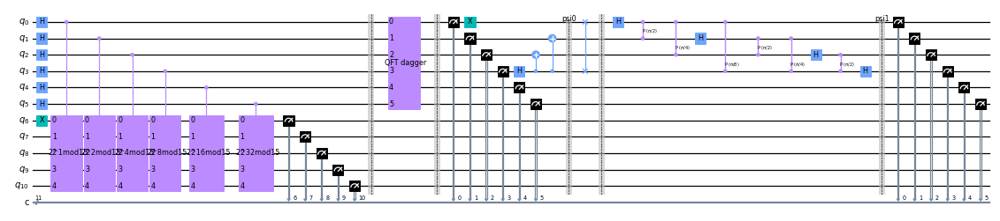

In [8]:
#Shor's Algorithm Code
# Initialize quantum states based on input parameter vals
def initStates(q_c,vals):
  if vals==0:        
      pass
  elif vals==1:      
      q_c.x(0)  # If vals is 1, apply X gate to qubit 0
  elif vals=='all':  
      q_c.h(0); q_c.h(1); q_c.h(2); q_c.h(3)  # If vals is 'all', apply H gates to first 4 qubits
  elif vals==[1,15]:  
      q_c.h(3); q_c.cx(3,2); q_c.cx(3,1); q_c.x(0)
  elif vals==[2,14]: 
      q_c.h(3); q_c.cx(3,2); q_c.x(1)
  elif vals==[3,13]: 
      q_c.h(3); q_c.cx(3,2); q_c.cx(3,1); q_c.x(1); q_c.x(0)
  elif vals==[4,12]: 
      q_c.h(3); q_c.x(2)

N_COUNT = 6  # number of counting qubits
a = 2        # Value to use for modular exponentiation
q_c = QuantumCircuit(N_COUNT + 5, N_COUNT + 5)

for q in range(N_COUNT):
    q_c.h(q)

q_c.x(N_COUNT) # X gate initializes the second register in state |00001>,in preparation for accumulating the modular exponential.

for q in range(N_COUNT):
    q_c.append(c_a_mod15(a, 2**q), [q] + [i+N_COUNT for i in range(5)])
    
q_c.measure([6, 7, 8, 9, 10], [6,7,8,9,10])     # measure q6,q7,q8,q9,q10 and store in c0,c1,c2,c3,c4
q_c.barrier()
q_c.append(qft_dag(N_COUNT), range(N_COUNT))
q_c.barrier()
q_c.measure(range(N_COUNT), range(N_COUNT))
q_c.draw(fold=-1,cregbundle=False)

aer_sim = Aer.get_backend('aer_simulator')
t_U = transpile(q_c, aer_sim)
counts = aer_sim.run(t_U).result().get_counts()
plot_histogram(counts)

rows, measured_phases = [], []
for output in counts:
    #decimal = int(output, 2)  # Convert (base 2) string to decimal
    decimal = int(output[-N_COUNT:], 2)  # Take lowest 6 bits (result of 1st register) 
    phase = decimal/(2**N_COUNT)  # Find corresponding eigenvalue
    measured_phases.append(phase)
    # Add these values to the rows in our table:
    rows.append([f"u={output[:5]} f={output[-6:]}(bin) = {decimal:>3}(dec)",
                 f"{decimal}/{2**N_COUNT} = {phase:.2f}"])
    
# Print the rows in a table
headers=["(2nd reg: 5 bits) (1st reg: 6 bits)", "Phase"]
df = pd.DataFrame(rows, columns=headers)
print(df)

#cir = qiskit.QuantumCircuit(4,4)
initStates (q_c,[1,15])                        
q_c.save_statevector(label='psi0')
q_c.swap(0,3); cir.swap(1,2)                 
q_c.barrier()
q_c.h(0); q_c.cp(np.pi/2, 1,0); q_c.cp(np.pi/4, 2,0); q_c.cp(np.pi/8, 3,0)
q_c.h(1); q_c.cp(np.pi/2, 2,1); q_c.cp(np.pi/4, 3,1)
q_c.h(2); q_c.cp(np.pi/2, 3,2)
q_c.h(3)
q_c.save_statevector(label='psi1')
q_c.measure([0,1,2,3,4,5],[0,1,2,3,4,5])
fig,ax = plt.subplots (figsize=(24,3))
q_c.draw('mpl', fold=-1, justify='left', ax=ax); plt.show()

# Run
sim = qiskit.Aer.get_backend('statevector_simulator')
exe = qiskit.transpile(q_c, sim)
job = sim.run(exe, shots=10000)
res = job.result()
cts = res.get_counts(exe)
psi = getStatevectors (res, 'psi')
fig,axs = plt.subplots (1,3, figsize=(180,100)); fig.tight_layout() 
ax=axs[0]; plotStatevector(psi[0],ax=ax,vertical=True); ax.set_title ('psi0')
ax=axs[1]; plotStatevector(psi[1],ax=ax,vertical=True); ax.set_title ('psi1')
ax=axs[2]; plotHistogram(cts,ax=ax,vertical=True); ax.set_title ('cts');

# Plotting States with Counts

By making some changes to the plotHistogram function, we can disgard any state that does not have a count in the histogram. This reveals that there is some periodic nature in this histogram. 

In [10]:
def plotHistogram(counts, ax='auto', figsize='auto', vertical=False, fc='#9cf', textrot=0):
    # Filter out zero counts
    filtered_counts = {key: value for key, value in counts.items() if value > 0}
    nmax = len(list(filtered_counts.keys())[0])  # Updated number of bits after filtering
    labels = list(filtered_counts.keys())
    values = list(filtered_counts.values())

    # Dimensions
    ymax = max(values)
    lmax = len(labels)

    # Create an axis if none is supplied
    if ax == 'auto':
        if figsize == 'auto':
            figsize = (2, 6) if vertical else (6, 1)
        fig, ax = plt.subplots(figsize=figsize)

    # Plot
    if vertical:
        for i, count in enumerate(values):
            patch = patches.Rectangle([0, -i - 1], count, 1, ec='black', fc=fc)
            ax.add_patch(patch)
            if count > 0:
                y = count + 0.07 * ymax if count < 0.9 * ymax else count - 0.07 * ymax
                ax.text(y, -i - 1 + 0.5, count, va='center', ha='center')
        ax.set_yticks([-i - 1 + 0.5 for i in range(lmax)])
        ax.set_yticklabels(labels)
        ax.set_ylim(-lmax - 0.5, 0.5)
        ax.set_xlim(0, ymax * 1.02)
    else:
        for i, count in enumerate(values):
            patch = patches.Rectangle([i, 0], 1, count, ec='black', fc=fc)
            ax.add_patch(patch)
            if count > 0:
                y = count + 0.07 * ymax if count < 0.9 * ymax else count - 0.07 * ymax
                ax.text(i + 0.5, y, count, va='center', ha='center')
        ax.set_xticks([i + 0.5 for i in range(lmax)])
        ax.set_xticklabels(labels)
        ax.tick_params(axis='x', labelrotation=textrot)
        ax.set_xlim(-0.5, lmax + 0.5)
        ax.set_ylim(0, ymax * 1.02)

In [11]:
sim = qiskit.Aer.get_backend('statevector_simulator')
exe = qiskit.transpile(q_c, sim)
job = sim.run(exe, shots=10000)
res = job.result()
cts = res.get_counts(exe)
psi = getStatevectors (res, 'psi')
fig,axs = plt.subplots (1,3, figsize=(180,100)); fig.tight_layout() 
ax=axs[0]; plotStatevector(psi[0],ax=ax,vertical=True); ax.set_title ('psi0')
ax=axs[1]; plotStatevector(psi[1],ax=ax,vertical=True); ax.set_title ('psi1')
ax=axs[2]; plotHistogram(cts,ax=ax,vertical=True); ax.set_title ('cts');

Looking at the far right plot, one could be convinced that there is some periodic nature embedded. [Section 5.3](https://courses.edx.org/c4x/BerkeleyX/CS191x/asset/chap5.pdf) of this textbook explains how the problem of factoring large numbers (Shor's algorithm) can essentially be broken down into a period finding problem.  

# Final Comments

Throughout this demo, it was hopefully made clear that quantum algorithms are going to be powerful tools in the near future. They will allow us to do computations that would take the best classical computers on the order of thousands of years, where a quantum computer will solve them in a day. A reasonable question someone may be having right now is, "We have quantum computers already, why haven't we done this?", which is a great question. The best quantum computers available today have on the order of hundreds of qubits. This will need to increase to the order of thousands to be able to implement some of these algorithms. With the best and brightness minds and companys working on this, it won't be long before we see the next leap in computing abilities.